In [1]:
import numpy as np
import pandas as pd
import scipy as sc
from scipy import stats

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, roc_curve, make_scorer,f1_score, accuracy_score
from sklearn.metrics import precision_score, recall_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler, normalize, MinMaxScaler

pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 10000)

# 1 Загрузка файла

In [2]:
breast = pd.read_csv('data_breast.csv')
breast = breast.drop(['Unnamed: 32', 'id'], axis=1)
breast.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


# 2 Основные статистики для переменных

In [3]:
breast.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,0.405172,1.216853,2.866059,40.337079,0.007041,0.025478,0.031894,0.011796,0.020542,0.003795,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,0.277313,0.551648,2.021855,45.491006,0.003003,0.017908,0.030186,0.006170,0.008266,0.002646,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,0.111500,0.360200,0.757000,6.802000,0.001713,0.002252,0.000000,0.000000,0.007882,0.000895,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,0.232400,0.833900,1.606000,17.850000,0.005169,0.013080,0.015090,0.007638,0.015160,0.002248,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,0.324200,1.108000,2.287000,24.530000,0.006380,0.020450,0.025890,0.010930,0.018730,0.003187,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,0.478900,1.474000,3.357000,45.190000,0.008146,0.032450,0.042050,0.014710,0.023480,0.004558,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,2.873000,4.885000,21.980000,542.200000,0.031130,0.135400,0.396000,0.052790,0.078950,0.029840,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [4]:
breast.mode()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,B,12.34,14.93,82.61,512.2,0.1007,0.1147,0.0,0.0,0.1601,0.05667,0.2204,0.8561,1.778,16.64,0.005080,0.01104,0.0,0.0,0.01344,0.001784,12.36,17.70,101.7,284.4,0.1216,0.1486,0.0,0.0,0.2226,0.07427
1,NaN,NaN,15.70,87.76,NaN,NaN,0.1206,NaN,NaN,0.1714,0.05907,0.2860,1.1500,NaN,16.97,0.005251,0.01812,NaN,NaN,NaN,0.001892,NaN,27.26,105.9,402.8,0.1223,0.3416,NaN,NaN,0.2369,NaN
2,NaN,NaN,16.84,134.70,NaN,NaN,NaN,NaN,NaN,0.1717,0.05913,NaN,1.2680,NaN,17.67,0.005298,0.02310,NaN,NaN,NaN,0.001906,NaN,NaN,117.7,439.6,0.1234,NaN,NaN,NaN,0.2383,NaN
3,NaN,NaN,16.85,NaN,NaN,NaN,NaN,NaN,NaN,0.1769,0.06113,NaN,1.3500,NaN,18.54,0.005518,NaN,NaN,NaN,NaN,0.001956,NaN,NaN,NaN,458.0,0.1256,NaN,NaN,NaN,0.2972,NaN
4,NaN,NaN,17.46,NaN,NaN,NaN,NaN,NaN,NaN,0.1893,0.06782,NaN,NaN,NaN,NaN,0.005884,NaN,NaN,NaN,NaN,0.001971,NaN,NaN,NaN,472.4,0.1275,NaN,NaN,NaN,0.3109,NaN
5,NaN,NaN,18.22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.005910,NaN,NaN,NaN,NaN,0.001976,NaN,NaN,NaN,489.5,0.1312,NaN,NaN,NaN,0.3196,NaN
6,NaN,NaN,18.90,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.005969,NaN,NaN,NaN,NaN,0.002205,NaN,NaN,NaN,546.7,0.1347,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,19.83,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.006040,NaN,NaN,NaN,NaN,0.002256,NaN,NaN,NaN,547.4,0.1401,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,20.52,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.006064,NaN,NaN,NaN,NaN,0.002551,NaN,NaN,NaN,624.1,0.1415,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.006399,NaN,NaN,NaN,NaN,0.002665,NaN,NaN,NaN,698.8,NaN,NaN,NaN,NaN,NaN,NaN


# 3 Стратегия для работы с пропущенными значениями

Показывает, что у нас нет пропущенных значений

In [5]:
breast.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
diagnosis                  569 non-null object
radius_mean                569 non-null float64
texture_mean               569 non-null float64
perimeter_mean             569 non-null float64
area_mean                  569 non-null float64
smoothness_mean            569 non-null float64
compactness_mean           569 non-null float64
concavity_mean             569 non-null float64
concave points_mean        569 non-null float64
symmetry_mean              569 non-null float64
fractal_dimension_mean     569 non-null float64
radius_se                  569 non-null float64
texture_se                 569 non-null float64
perimeter_se               569 non-null float64
area_se                    569 non-null float64
smoothness_se              569 non-null float64
compactness_se             569 non-null float64
concavity_se               569 non-null float64
concave points_se          569 n

Еще один вариант, показывающий, что у нас нет пропущенных значений

In [6]:
(breast.isna().sum() / breast.shape[0]).sort_values(ascending=False).reset_index().head()

,index,0
0,fractal_dimension_worst,0.0
1,area_se,0.0
2,radius_mean,0.0
3,texture_mean,0.0
4,perimeter_mean,0.0


Преобразование категориальной переменной (В - доброкачественная = 0, М - злокачественная = 1)

In [7]:
exter_dict_d = ['diagnosis']
exter_dict = { 'diagnosis': {'B':0, 'M':1}}
breast.replace(exter_dict, inplace=True)
breast[exter_dict_d] = breast[exter_dict_d].fillna(0)
breast.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


# 4 Рассчитать и визуализировать корреляционную матрицу для переменных

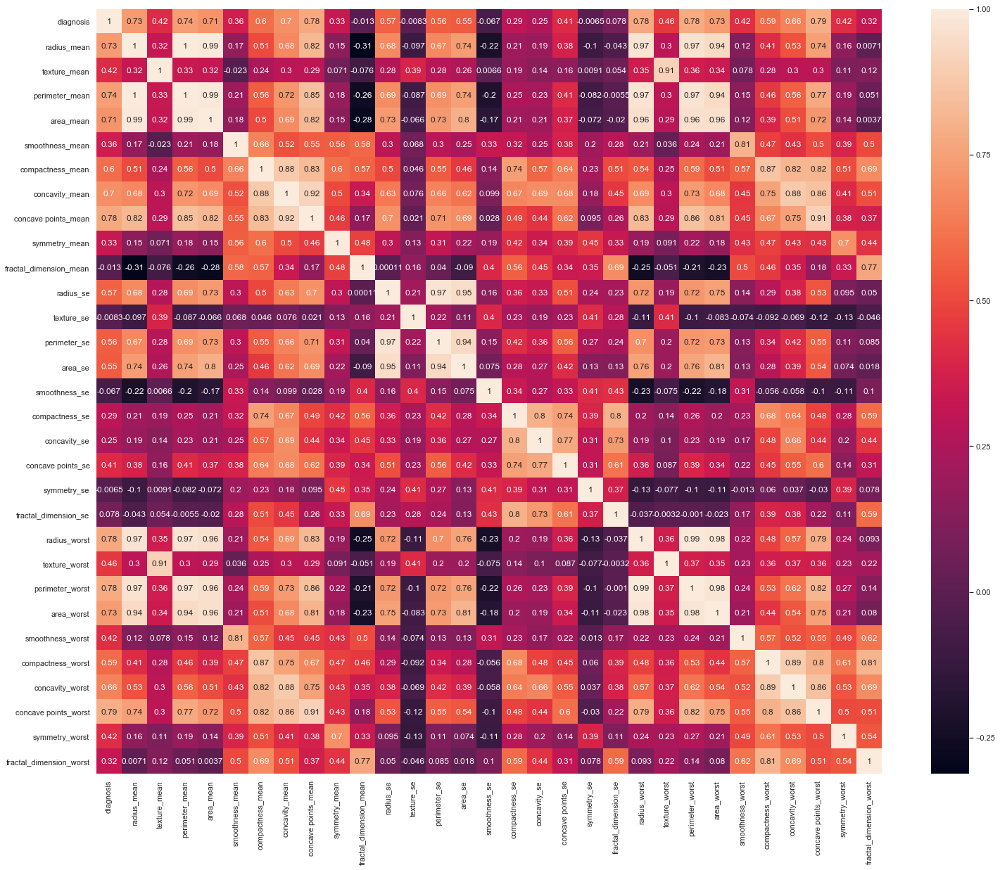

In [8]:
corr_matrix = breast.corr()
sns.set(rc={'figure.figsize':(25, 20)})
sns.heatmap(corr_matrix, annot = True, xticklabels = corr_matrix.columns.values,yticklabels = corr_matrix.columns.values)

# 5 Визуализировать взаимосвязи между переменными

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


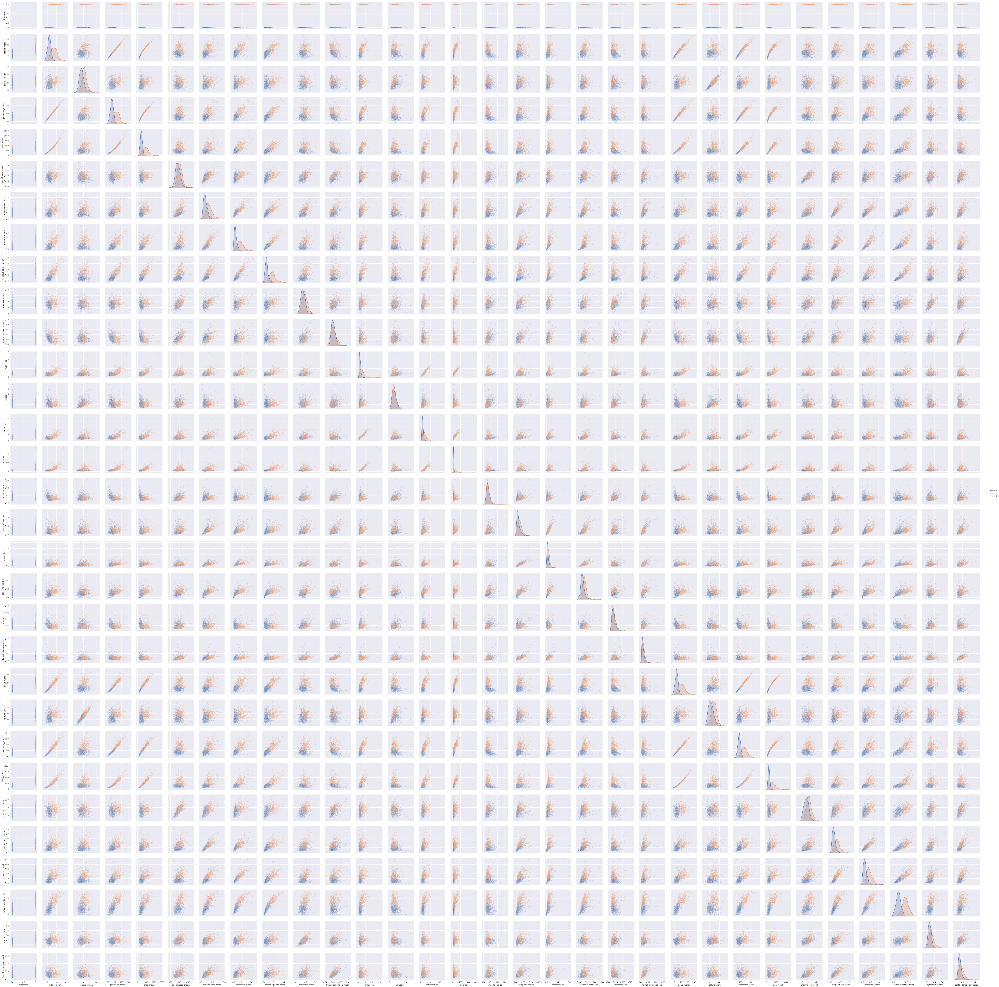

In [9]:
graph = sns.pairplot(data=breast ,plot_kws={'alpha':0.2},hue='diagnosis')

Для более удобного просмотра сохраню как картинку

In [10]:
graph.savefig("breast.png")

# 6 С помощью статистических методов проверить взаимосвязи между переменными

In [11]:
pearson_coef, p_value = stats.pearsonr(breast['radius_mean'], breast['area_mean']) 
print("Pearson Correlation Coefficient: ", pearson_coef, "and a P-value of:", p_value)

Pearson Correlation Coefficient:  0.9873571700566123 and a P-value of: 0.0


In [12]:
pearson_coef, p_value = stats.pearsonr(breast['area_mean'], breast['fractal_dimension_mean']) 
print("Pearson Correlation Coefficient: ", pearson_coef, "and a P-value of:", p_value)

Pearson Correlation Coefficient:  -0.28310981169142624 and a P-value of: 6.001521933597108e-12


# 7,8 Выбрать стратегию Feature Selection и рассчитать ее для выбранных переменных

Стратегия Feature Selection - сокращение размерности

Рассчитаем корреляцию переменных с нашей таргет-переменной

In [13]:
corrmat = breast.corr()
fcor=corrmat.abs().unstack().sort_values(ascending=False).reset_index()
fcor.columns = ['Feature_1', 'Feature_2','r']
fcor.query('Feature_2 !="diagnosis" & Feature_1 == "diagnosis"').head()

,Feature_1,Feature_2,r
120,diagnosis,concave points_worst,0.793566
124,diagnosis,perimeter_worst,0.782914
125,diagnosis,concave points_mean,0.776614
127,diagnosis,radius_worst,0.776454
154,diagnosis,perimeter_mean,0.742636


In [14]:
high_corr = fcor.\
query('Feature_2 !="diagnosis" & Feature_1 == "diagnosis" & r>0.2')['Feature_2'].tolist()
high_corr.append('diagnosis')
high_corr

['concave points_worst',
 'perimeter_worst',
 'concave points_mean',
 'radius_worst',
 'perimeter_mean',
 'area_worst',
 'radius_mean',
 'area_mean',
 'concavity_mean',
 'concavity_worst',
 'compactness_mean',
 'compactness_worst',
 'radius_se',
 'perimeter_se',
 'area_se',
 'texture_worst',
 'smoothness_worst',
 'symmetry_worst',
 'texture_mean',
 'concave points_se',
 'smoothness_mean',
 'symmetry_mean',
 'fractal_dimension_worst',
 'compactness_se',
 'concavity_se',
 'diagnosis']

In [15]:
low_corr = (fcor.query('r<0.2 & Feature_2 == "diagnosis"')['Feature_1']).tolist()
low_corr

['fractal_dimension_se',
 'smoothness_se',
 'fractal_dimension_mean',
 'texture_se',
 'symmetry_se']

Переменные с высокой корреляцией проверим на мультиколлинеарность

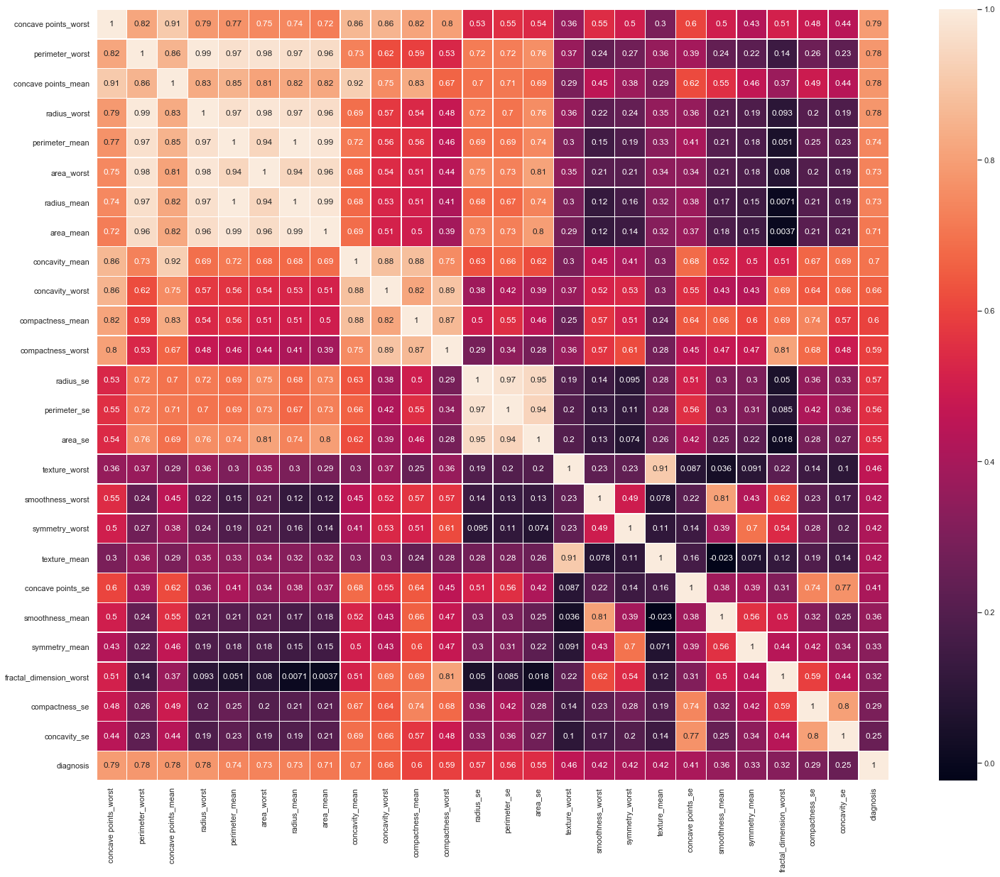

In [16]:
sns.heatmap(breast[high_corr].corr(), annot=True, linewidths=0.5)
sns.set(rc={'figure.figsize':(12,12)})

Так как корреляция perimeter_worst, concave points_mean, radius_worst одинакова, то оставлю только perimeter_worst

Так как корреляция area_worst и radius_mean одинакова, то оставлю только radius_mean

Так как корреляция smoothness_worst, symmetry_worst, texture_mean одинакова, то оставлю только texture_mean

Также уберу переменные из списка low_corr

In [17]:
breast = breast.drop(['concave points_mean','radius_worst','area_worst', 'fractal_dimension_se', 'smoothness_se',\
'fractal_dimension_mean', 'texture_se', 'symmetry_se', 'smoothness_worst', 'symmetry_worst'], axis =1)

In [18]:
breast.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 21 columns):
diagnosis                  569 non-null int64
radius_mean                569 non-null float64
texture_mean               569 non-null float64
perimeter_mean             569 non-null float64
area_mean                  569 non-null float64
smoothness_mean            569 non-null float64
compactness_mean           569 non-null float64
concavity_mean             569 non-null float64
symmetry_mean              569 non-null float64
radius_se                  569 non-null float64
perimeter_se               569 non-null float64
area_se                    569 non-null float64
compactness_se             569 non-null float64
concavity_se               569 non-null float64
concave points_se          569 non-null float64
texture_worst              569 non-null float64
perimeter_worst            569 non-null float64
compactness_worst          569 non-null float64
concavity_worst            569 no

In [19]:
breast.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,symmetry_mean,radius_se,perimeter_se,area_se,compactness_se,concavity_se,concave points_se,texture_worst,perimeter_worst,compactness_worst,concavity_worst,concave points_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.2419,1.0950,8.589,153.40,0.04904,0.05373,0.01587,17.33,184.60,0.6656,0.7119,0.2654,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.1812,0.5435,3.398,74.08,0.01308,0.01860,0.01340,23.41,158.80,0.1866,0.2416,0.1860,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.2069,0.7456,4.585,94.03,0.04006,0.03832,0.02058,25.53,152.50,0.4245,0.4504,0.2430,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.2597,0.4956,3.445,27.23,0.07458,0.05661,0.01867,26.50,98.87,0.8663,0.6869,0.2575,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.1809,0.7572,5.438,94.44,0.02461,0.05688,0.01885,16.67,152.20,0.2050,0.4000,0.1625,0.07678


# 9,10 Предсказание переменной 'Diagnosis' и проверка качества классификации

Нормализуем данные, исключая колонку 'diagnosis'

In [20]:
X = breast.drop(['diagnosis'], axis=1)
y = breast.diagnosis

In [21]:
col = X.columns
X = StandardScaler().fit_transform(X)
X = pd.DataFrame(X, columns=col).astype('float64')
X.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,symmetry_mean,radius_se,perimeter_se,area_se,compactness_se,concavity_se,concave points_se,texture_worst,perimeter_worst,compactness_worst,concavity_worst,concave points_worst,fractal_dimension_worst
0,1.097064,-2.073335,1.269934,0.984375,1.568466,3.283515,2.652874,2.217515,2.489734,2.833031,2.487578,1.316862,0.724026,0.660820,-1.359293,2.303601,2.616665,2.109526,2.296076,1.937015
1,1.829821,-0.353632,1.685955,1.908708,-0.826962,-0.487072,-0.023846,0.001392,0.499255,0.263327,0.742402,-0.692926,-0.440780,0.260162,-0.369203,1.535126,-0.430444,-0.146749,1.087084,0.281190
2,1.579888,0.456187,1.566503,1.558884,0.942210,1.052926,1.363478,0.939685,1.228676,0.850928,1.181336,0.814974,0.213076,1.424827,-0.023974,1.347475,1.082932,0.854974,1.955000,0.201391
3,-0.768909,0.253732,-0.592687,-0.764464,3.283553,3.402909,1.915897,2.867383,0.326373,0.286593,-0.288378,2.744280,0.819518,1.115007,0.133984,-0.249939,3.893397,1.989588,2.175786,4.935010
4,1.750297,-1.151816,1.776573,1.826229,0.280372,0.539340,1.371011,-0.009560,1.270543,1.273189,1.190357,-0.048520,0.828471,1.144205,-1.466770,1.338539,-0.313395,0.613179,0.729259,-0.397100


Разделим на трейн и тест

In [22]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

Алгоритм Random Forest

In [23]:
clf_rf = RandomForestClassifier()

In [24]:
parametrs = {'n_estimators': range(10,50,100), 'max_depth' :range(1,5,9), 'criterion': ['gini', 'entropy']}

In [25]:
grid_search_cv_clf = GridSearchCV(clf_rf, parametrs, cv=5)
grid_search_cv_clf.fit(X_train, y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'n_estimators': range(10, 50, 100), 'max_depth': range(1, 5, 9), 'criterion': ['gini', 'entropy']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [26]:
grid_search_cv_clf.best_params_

{'criterion': 'entropy', 'max_depth': 1, 'n_estimators': 10}

In [27]:
best_clf = grid_search_cv_clf.best_estimator_
feature_importance = best_clf.feature_importances_
feature_importances_df = pd.DataFrame({'features': list(X_train), 'feature_importances' : feature_importance})

In [28]:
feature_importances_df.sort_values('feature_importances', ascending=False)

,features,feature_importances
15,perimeter_worst,0.3
17,concavity_worst,0.2
0,radius_mean,0.1
6,concavity_mean,0.1
9,perimeter_se,0.1
10,area_se,0.1
3,area_mean,0.1
5,compactness_mean,0.0
7,symmetry_mean,0.0
8,radius_se,0.0


In [29]:
y_pred = best_clf.predict(X_test)

In [30]:
precision_score(y_test, y_pred)

0.8923076923076924

In [31]:
recall_score(y_test, y_pred)

0.9666666666666667

In [32]:
best_clf.score(X_test, y_test)

0.9473684210526315

In [33]:
y_predicted_prob = best_clf.predict_proba(X_test)
y_predicted_prob[:10]

array([[0.69459411, 0.30540589],
       [0.91507032, 0.08492968],
       [0.5803254 , 0.4196746 ],
       [0.43868885, 0.56131115],
       [0.50252213, 0.49747787],
       [0.14173644, 0.85826356],
       [0.29229857, 0.70770143],
       [0.91507032, 0.08492968],
       [0.83623065, 0.16376935],
       [0.77239737, 0.22760263]])

In [34]:
accuracy_score(y_test,y_pred)

0.9473684210526315

In [35]:
f1_score(y_test,y_pred)

0.928

Logistic Regression

In [36]:
skm = LogisticRegression()

In [37]:
skm.fit(X_train, y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [38]:
skm.intercept_, skm.coef_

(array([-0.21424254]),
 array([[ 0.71881725,  0.31933626,  0.67633785,  0.79838589,  0.4745797 ,
         -1.13067982,  0.61975082,  0.3842884 ,  1.20550763,  0.34378542,
          1.01388898, -0.95069525, -0.34890888,  0.30941228,  1.13398689,
          1.31873463,  0.57819651,  1.05092552,  1.67751521,  0.46959168]]))

In [39]:
y_pred=skm.predict(X_test)
skm.score(X_test,y_test)

0.9766081871345029

In [40]:
y_predicted_prob = skm.predict_proba(X_test)
y_predicted_prob

array([[5.79836269e-01, 4.20163731e-01],
       [9.98127964e-01, 1.87203592e-03],
       [4.58722246e-01, 5.41277754e-01],
       [9.38980258e-03, 9.90610197e-01],
       [9.24341481e-01, 7.56585186e-02],
       [1.33489545e-04, 9.99866510e-01],
       [2.05399352e-01, 7.94600648e-01],
       [9.99992955e-01, 7.04534842e-06],
       [9.88998105e-01, 1.10018948e-02],
       [9.82544106e-01, 1.74558935e-02],
       [9.99947207e-01, 5.27926249e-05],
       [4.81092767e-04, 9.99518907e-01],
       [9.93847996e-01, 6.15200364e-03],
       [2.21838030e-05, 9.99977816e-01],
       [9.99936928e-01, 6.30720457e-05],
       [9.99819720e-01, 1.80280295e-04],
       [2.64114862e-04, 9.99735885e-01],
       [9.89010362e-01, 1.09896377e-02],
       [7.49330958e-03, 9.92506690e-01],
       [1.13706109e-05, 9.99988629e-01],
       [4.59662908e-09, 9.99999995e-01],
       [9.96078513e-01, 3.92148700e-03],
       [4.59783297e-01, 5.40216703e-01],
       [9.53339500e-01, 4.66604997e-02],
       [9.991535

In [41]:
precision_score(y_test, y_pred)

0.9516129032258065

In [42]:
recall_score(y_test, y_pred)

0.9833333333333333

In [43]:
accuracy_score(y_test,y_pred)

0.9766081871345029

In [44]:
f1_score(y_test,y_pred)

0.9672131147540983